In [1]:
import numpy as np
import pandas as pd
import scanpy as sc

In [2]:
import matplotlib.pyplot as plt
import matplotlib.patches as mplpatches

In [3]:
import plotnine as p9

In [4]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=200)

/gstore/home/wub31/.conda/envs/scanpy_Mar2022_env/lib/python3.7/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html


scanpy==1.8.2 anndata==0.7.8 umap==0.5.2 numpy==1.21.5 scipy==1.7.3 pandas==1.3.5 scikit-learn==1.0.2 statsmodels==0.13.2 python-igraph==0.9.9 pynndescent==0.5.6


In [6]:
aliquot_numbers=['1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18','19','20']

In [ ]:
adata = [sc.read_10x_mtx(directoryname,  
    var_names='gene_symbols',                  
    cache=True,gex_only=False)                                # write a cache file for faster subsequent reading
 for directoryname in [CellrangerOutput_d + d + '_force/outs/filtered_feature_bc_matrix' for d in aliquot_numbers ]]


In [9]:
for i in range(0,len(adata)):     
    adata[i].obs['aliquot']=aliquot_numbers[i]
    adata[i].obs['cell_bc']=adata[i].obs.index

In [10]:
adata = adata[0].concatenate(adata[1:]) 
len(adata.obs)

74000

In [11]:
adata.obs

,aliquot,cell_bc,batch
AAACCCACACATGAAA-1-0,1,AAACCCACACATGAAA-1,0
AAACCCACATCTAGAC-1-0,1,AAACCCACATCTAGAC-1,0
AAACCCATCAGGAGAC-1-0,1,AAACCCATCAGGAGAC-1,0
AAACGAAAGGAGTATT-1-0,1,AAACGAAAGGAGTATT-1,0
AAACGAAAGTGAGTGC-1-0,1,AAACGAAAGTGAGTGC-1,0
...,...,...,...
TTTGGTTGTCTCTCTG-1-19,20,TTTGGTTGTCTCTCTG-1,19
TTTGTTGCATAGCTGT-1-19,20,TTTGTTGCATAGCTGT-1,19
TTTGTTGTCAGTGGGA-1-19,20,TTTGTTGTCAGTGGGA-1,19
TTTGTTGTCATTACGG-1-19,20,TTTGTTGTCATTACGG-1,19


In [ ]:
adata.write(Output_d+'/T0_OAK/Anndata/OAK1to20_GEXwLineage_raw.h5ad')

In [6]:
adata=sc.read_h5ad(Output_d+'/T0_OAK/Anndata/OAK1to20_GEXwLineage_raw.h5ad')

In [14]:
LineageName=adata.var.index[adata.var['feature_types']== "CRISPR Guide Capture"]

LineageData=sc.get.obs_df(adata,keys=LineageName.tolist())

TopSup=LineageData.apply(lambda row: row.nlargest(2).values[0],axis=1)

df_lineage=TopSup.to_frame()

df_lineage.columns=['nUMI_TopSupLineage']

df_lineage['nUMI_secondary']=LineageData.apply(lambda row: row.nlargest(2).values[-1],axis=1)

df_lineage['second/top']=df_lineage['nUMI_secondary']/df_lineage['nUMI_TopSupLineage']

df_lineage['Lineage_assigned']=LineageData.idxmax(axis=1)*(df_lineage['second/top']<=0.5)

In [18]:
adata.obs=adata.obs.merge(df_lineage,how="left",left_index=True,right_index=True)

In [20]:
GEX_adata_filtered=adata[adata.obs['Lineage_assigned']!='',adata.var["feature_types"] == "Gene Expression"]

In [21]:
GEX_adata_filtered

View of AnnData object with n_obs × n_vars = 34829 × 36601
    obs: 'aliquot', 'cell_bc', 'batch', 'nUMI_TopSupLineage', 'nUMI_secondary', 'second/top', 'Lineage_assigned'
    var: 'gene_ids', 'feature_types'

In [23]:
sc.pp.calculate_qc_metrics(GEX_adata_filtered, inplace=True)


Trying to set attribute `.obs` of view, copying.


In [24]:
ribo_genes = GEX_adata_filtered.var_names.str.startswith(('RPS','RPL'))
sum(ribo_genes)

103

In [25]:
GEX_adata_filtered.obs['percent_ribo'] = np.sum(
    GEX_adata_filtered[:, ribo_genes].X, axis=1).A1 / np.sum(GEX_adata_filtered.X, axis=1).A1

In [26]:
mito_genes = GEX_adata_filtered.var_names.str.startswith(('MT-'))
sum(mito_genes)

13

In [27]:
GEX_adata_filtered.obs['percent_mito'] = np.sum(
    GEX_adata_filtered[:, mito_genes].X, axis=1).A1 / np.sum(GEX_adata_filtered.X, axis=1).A1

/gstore/home/wub31/.conda/envs/scanpy_Mar2022_env/lib/python3.7/site-packages/anndata/_core/anndata.py:1228: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
... storing 'Lineage_assigned' as categorical


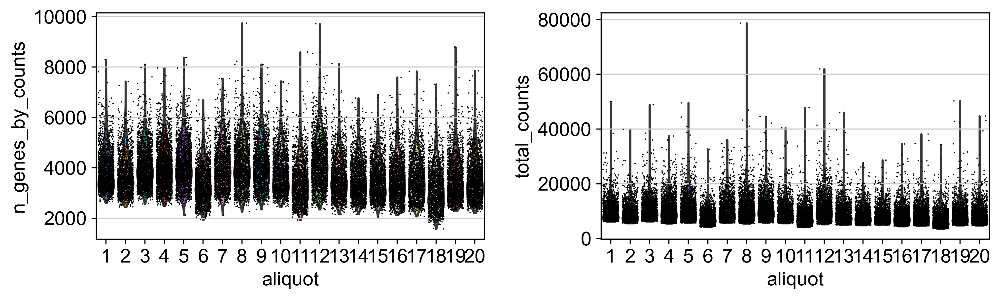

In [28]:
with plt.rc_context({'figure.figsize': (5, 3)}):
    sc.pl.violin(GEX_adata_filtered, ['n_genes_by_counts', 'total_counts'],
             jitter=0.4, multi_panel=True,groupby='aliquot')

In [29]:
np.mean(GEX_adata_filtered.obs.n_genes_by_counts)

3773.8308880530594

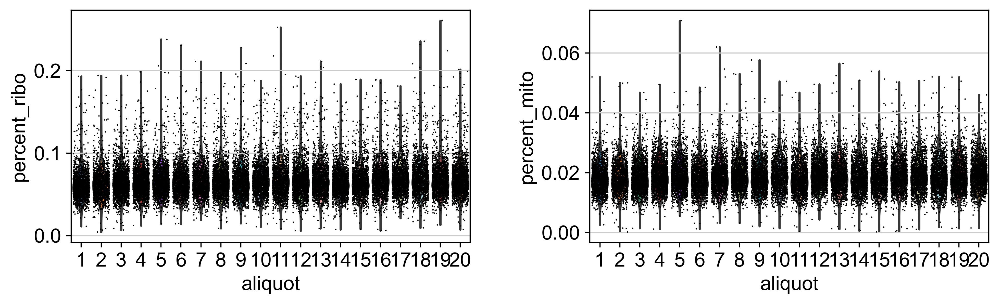

In [30]:
with plt.rc_context({'figure.figsize': (5, 3)}):
    sc.pl.violin(GEX_adata_filtered, ['percent_ribo', 'percent_mito'],
             jitter=0.4, multi_panel=True,groupby='aliquot')

In [31]:
sc.pp.normalize_total(GEX_adata_filtered, target_sum=1e4)

normalizing counts per cell
    finished (0:00:01)


In [32]:
sc.pp.log1p(GEX_adata_filtered)


In [33]:
GEX_adata_filtered.raw = GEX_adata_filtered
#Set the .raw attribute of AnnData object to the normalized and logarithmized raw gene expression for later use in differential testing and visualizations of gene expression. This simply freezes the state of the AnnData object.

In [34]:
GEX_adata_filtered.write(Output_d+'/T0_OAK/Anndata/OAK1to20_GEXwLineage_normalized.h5ad')

In [ ]:
#GEX_adata_filtered=sc.read_h5ad(Output_d+'/T0_OAK/Anndata/OAK1to20_GEXwLineage_normalized.h5ad')

In [48]:
df_T0oak1to20_LineageSum=GEX_adata_filtered.obs.Lineage_assigned.value_counts().to_frame()

In [49]:
df_T0oak1to20_LineageSum.Lineage_assigned.sum()

34829

In [50]:
df_T0oak1to20_LineageSum['pct_cells']=df_T0oak1to20_LineageSum.Lineage_assigned/34829

In [51]:
df_T0oak1to20_LineageSum

,Lineage_assigned,pct_cells
GENBC0218015,21899,0.628758
GENBC0231434,1143,0.032817
GENBC0268309,647,0.018576
GENBC0226882,622,0.017859
GENBC0278113,563,0.016165
...,...,...
GENBC0245906,1,0.000029
GENBC0247601,1,0.000029
GENBC0249398,1,0.000029
GENBC0279378,1,0.000029


In [52]:
df_T0oak1to20_LineageSum['Lineage_id']=df_T0oak1to20_LineageSum.index

In [53]:
df_T0oak1to20_LineageSum.columns=['T0oak1to20_NumCells','T0oak1to20_PctCells','LineageID']

In [54]:
df_T0oak1to20_LineageSum

,T0oak1to20_NumCells,T0oak1to20_PctCells,LineageID
GENBC0218015,21899,0.628758,GENBC0218015
GENBC0231434,1143,0.032817,GENBC0231434
GENBC0268309,647,0.018576,GENBC0268309
GENBC0226882,622,0.017859,GENBC0226882
GENBC0278113,563,0.016165,GENBC0278113
...,...,...,...
GENBC0245906,1,0.000029,GENBC0245906
GENBC0247601,1,0.000029,GENBC0247601
GENBC0249398,1,0.000029,GENBC0249398
GENBC0279378,1,0.000029,GENBC0279378


In [55]:
df_T0oak1to20_LineageSum.to_csv(Output_d+'/T0_OAK/Anndata/OAK1to20_lineage_summary.csv',index=False)

In [56]:
sc.pp.highly_variable_genes(GEX_adata_filtered, min_mean=0.0125, max_mean=3, min_disp=0.5)


extracting highly variable genes
    finished (0:00:06)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


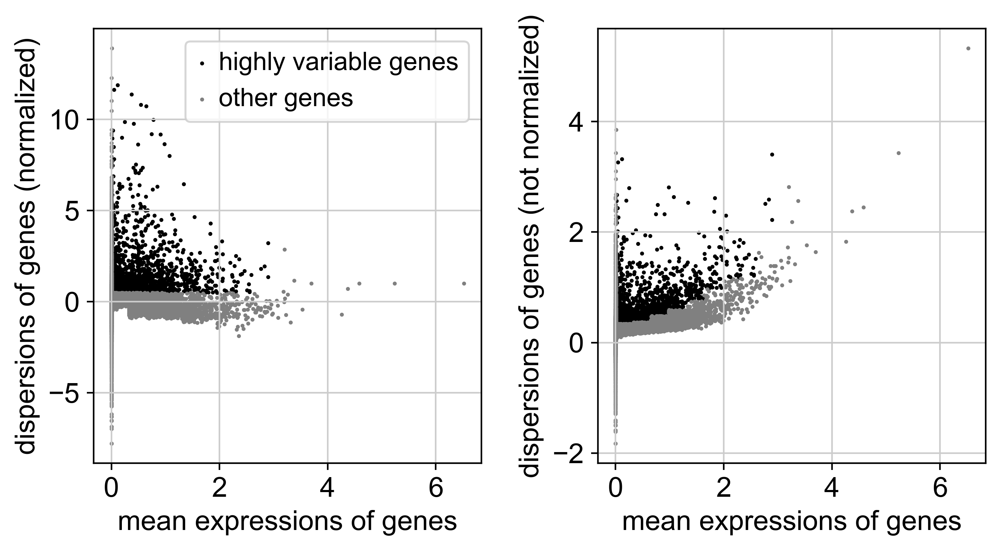

In [59]:
sc.pl.highly_variable_genes(GEX_adata_filtered)


In [60]:
sc.pp.scale(GEX_adata_filtered, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [61]:
sc.tl.pca(GEX_adata_filtered, svd_solver='arpack',n_comps=50)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:05)


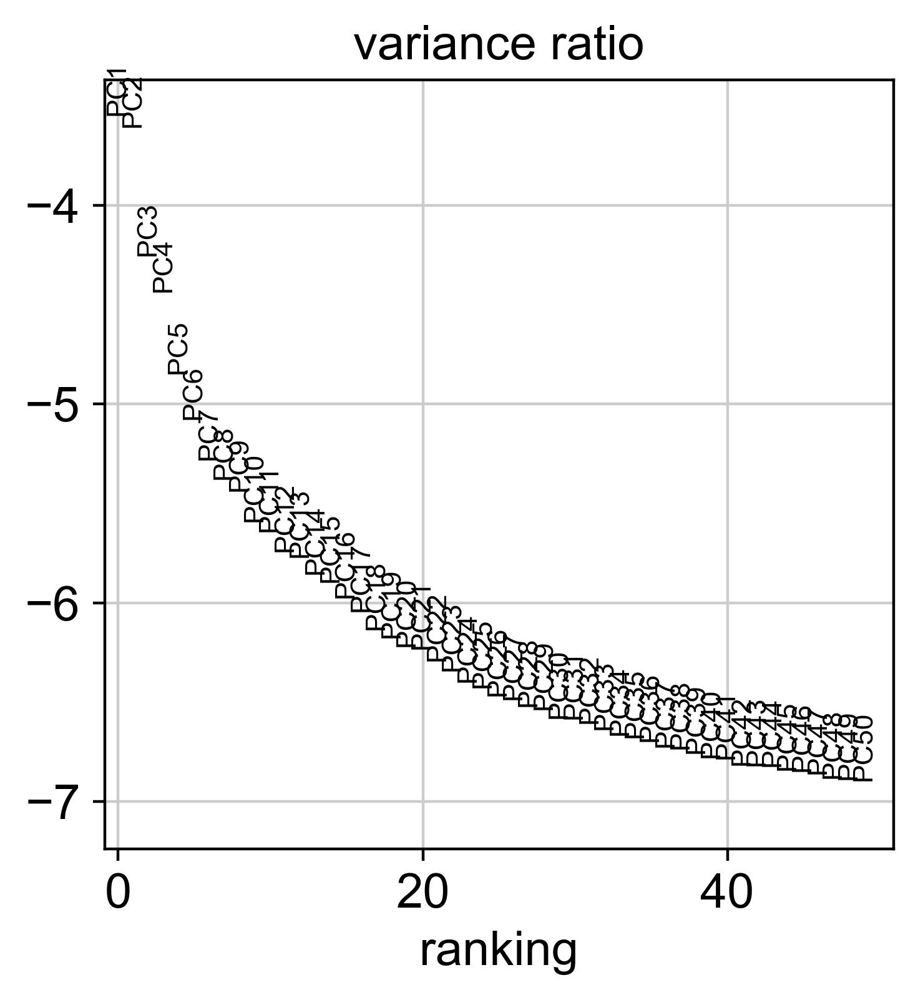

In [62]:
sc.pl.pca_variance_ratio(GEX_adata_filtered, log=True,n_pcs=50)


In [63]:
sc.pp.neighbors(GEX_adata_filtered, n_neighbors=15, n_pcs=40)


computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:18)


In [64]:
sc.tl.leiden(GEX_adata_filtered,resolution=1,key_added="leiden_1")


running Leiden clustering
    finished: found 21 clusters and added
    'leiden_1', the cluster labels (adata.obs, categorical) (0:00:09)


In [65]:
sc.tl.paga(GEX_adata_filtered,groups='leiden_1')
sc.pl.paga(GEX_adata_filtered, plot=False) 
sc.tl.umap(GEX_adata_filtered,init_pos='paga')

running PAGA
    finished: added
    'paga/connectivities', connectivities adjacency (adata.uns)
    'paga/connectivities_tree', connectivities subtree (adata.uns) (0:00:01)
--> added 'pos', the PAGA positions (adata.uns['paga'])
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:38)


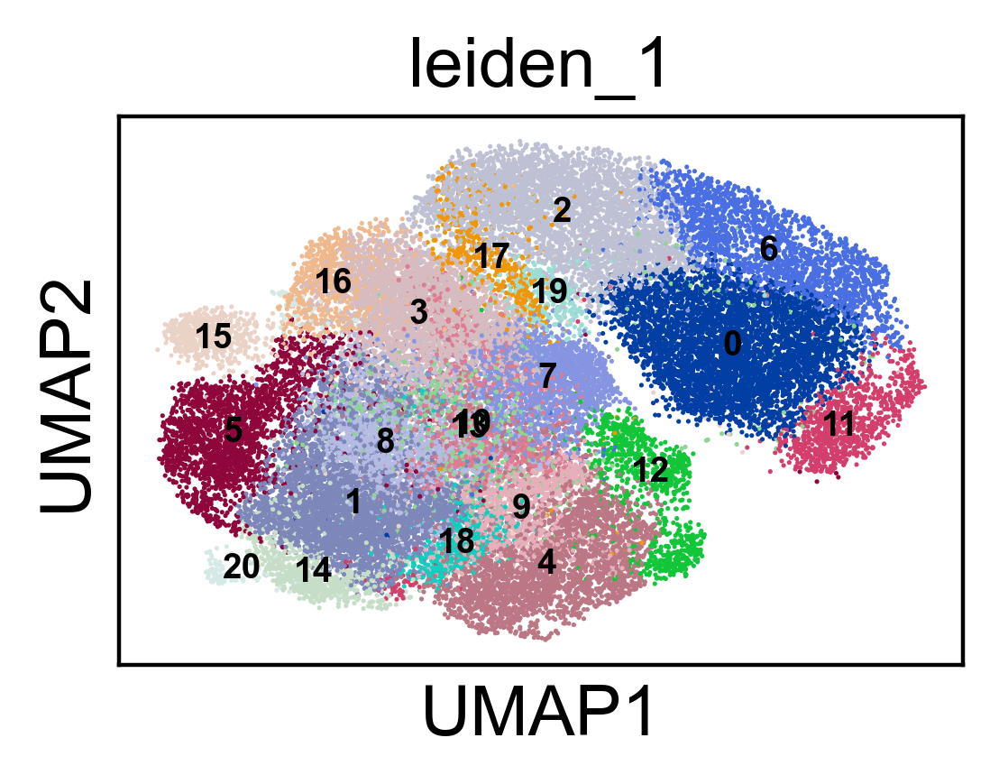

In [66]:
with plt.rc_context({"figure.figsize": (3, 2),"font.size":7}):
    sc.pl.umap(GEX_adata_filtered, color=['leiden_1' ]
           ,ncols=1,legend_loc='on data')


the obs value 'Lineage_assigned' has more than 103 categories. Uniform 'grey' color will be used for all categories.


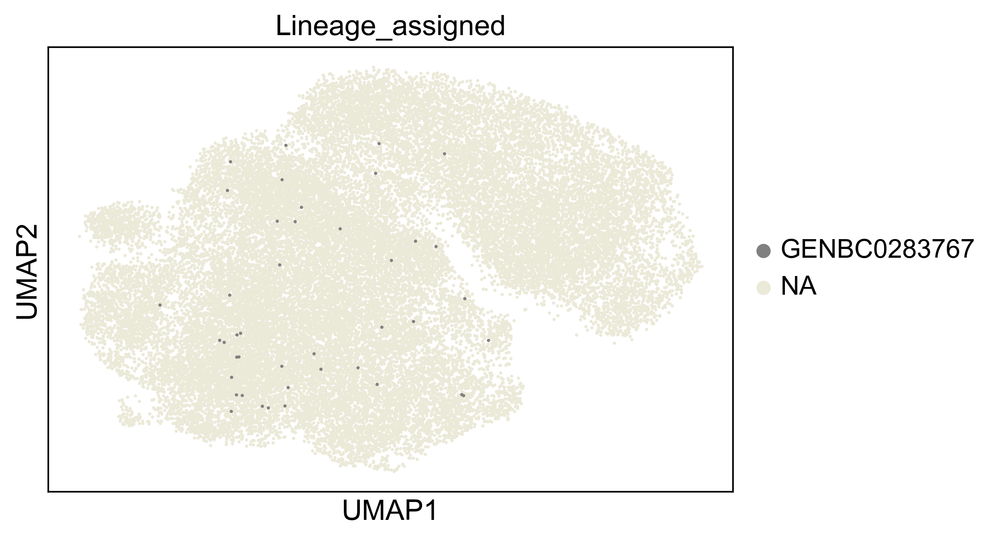

In [68]:
with plt.rc_context({"figure.figsize": (6, 4),"font.size":10}):
    sc.pl.umap(GEX_adata_filtered,color='Lineage_assigned',groups=['GENBC0283767'],size=10
           ,ncols=1,legend_loc='right margin',na_color='#EBE9D8')


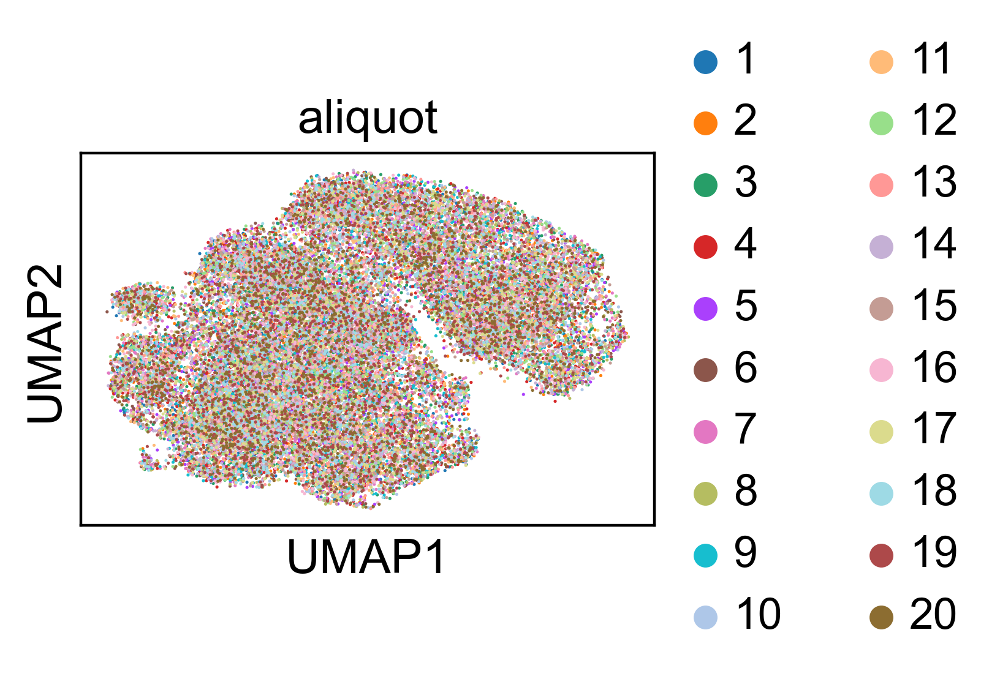

In [69]:
with plt.rc_context({"figure.figsize": (3, 2),"font.size":7}):
    sc.pl.umap(GEX_adata_filtered, color=['aliquot' ]
           ,ncols=1,legend_loc='right margin')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:02:56)


/gstore/home/wub31/.conda/envs/scanpy_Mar2022_env/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
/gstore/home/wub31/.conda/envs/scanpy_Mar2022_env/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`
/gstore/home/wub31/.conda/envs/scanpy_Mar2022_env/lib/python3.7/site-packages/scanpy/tools/_rank_genes_groups.py:399: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling

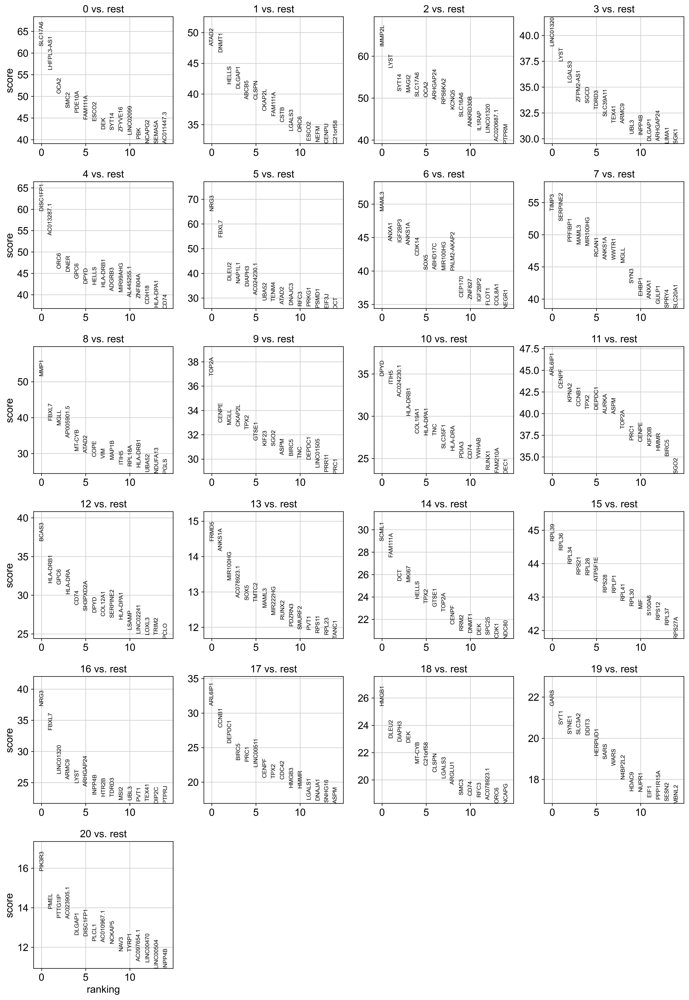

In [72]:
sc.tl.rank_genes_groups(GEX_adata_filtered, 'leiden_1', method='wilcoxon')
sc.pl.rank_genes_groups(GEX_adata_filtered, n_genes=15, sharey=False)

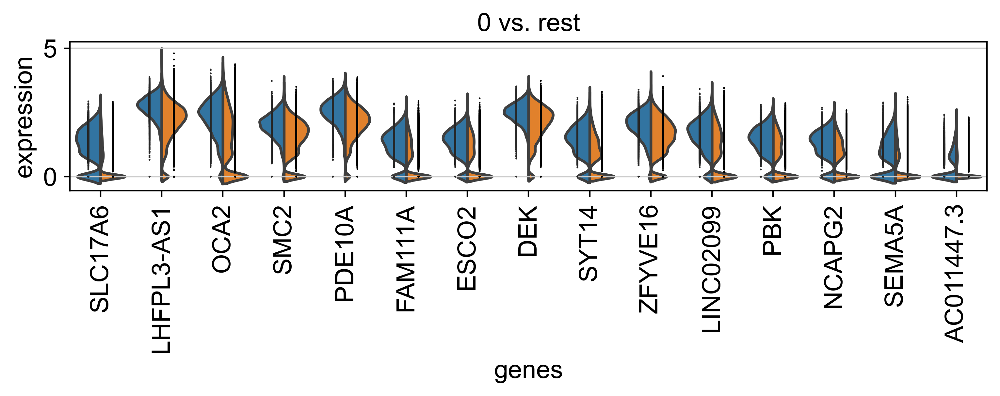

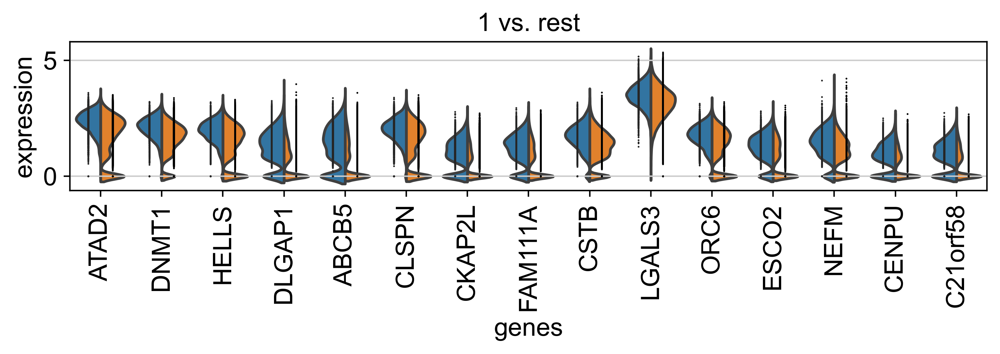

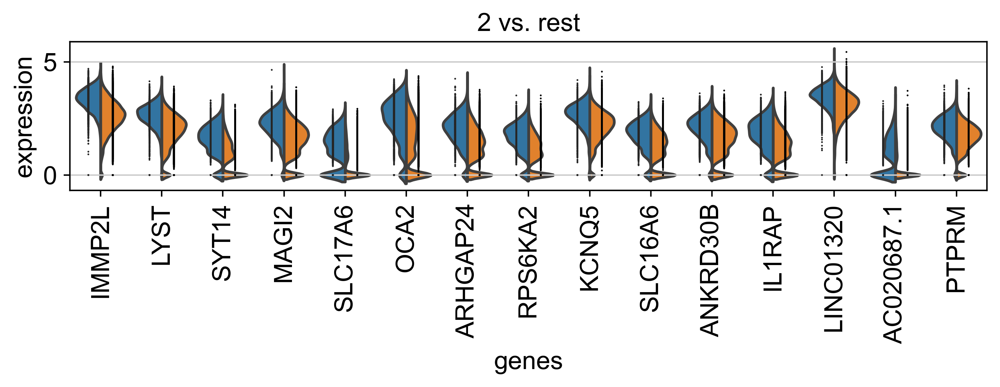

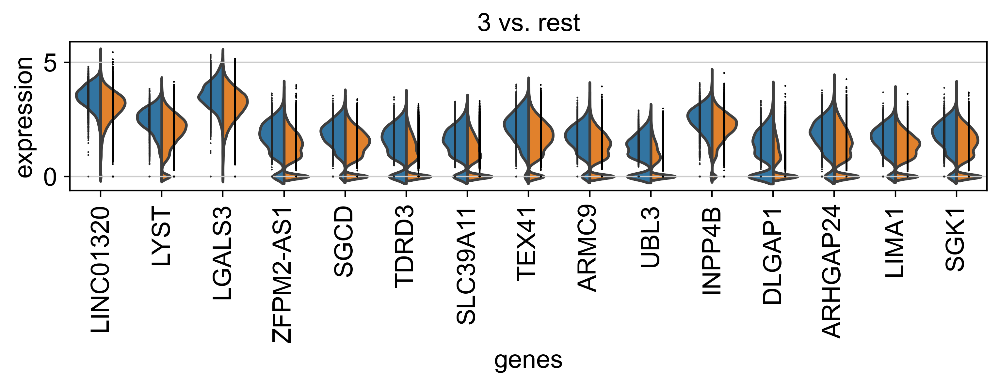

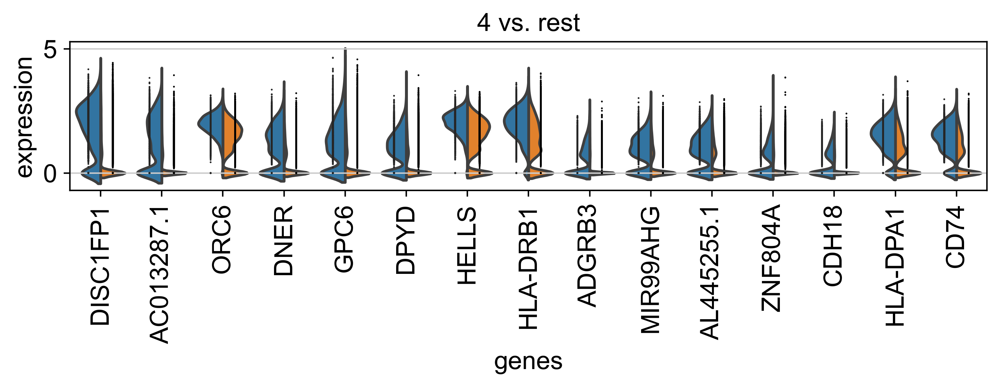

...

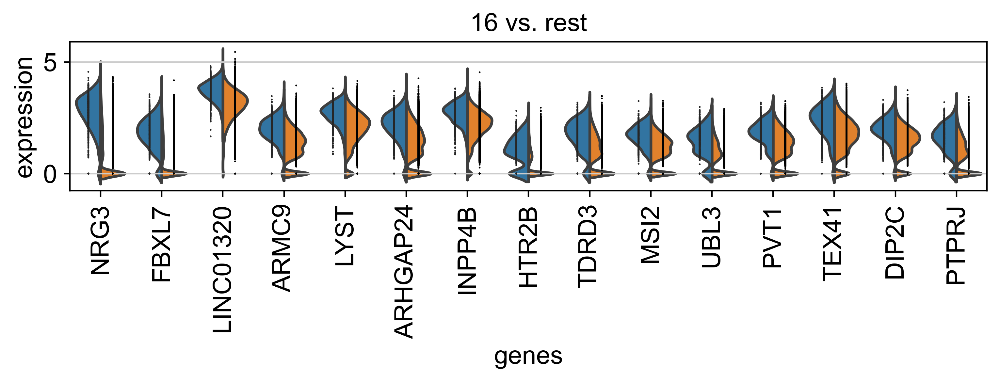

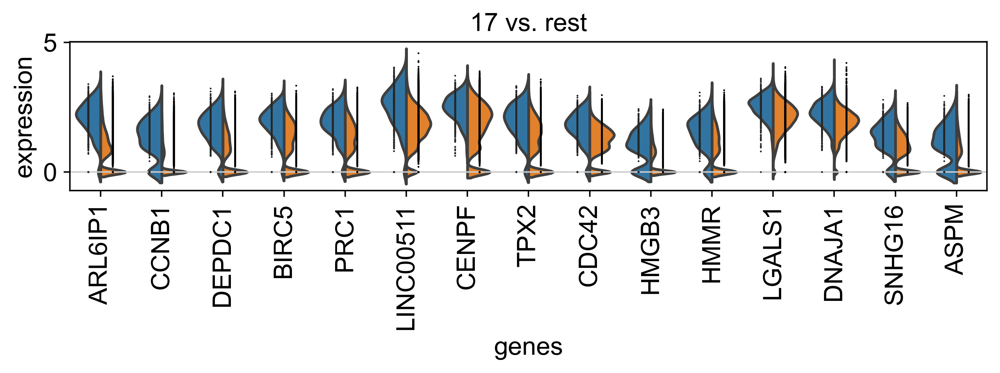

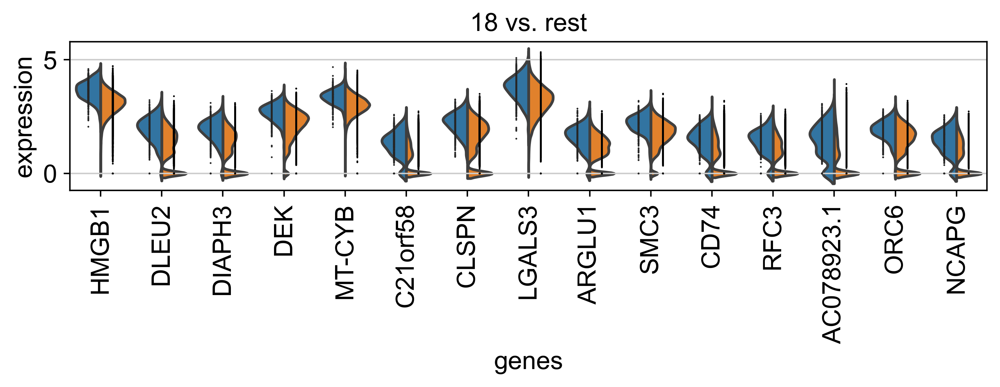

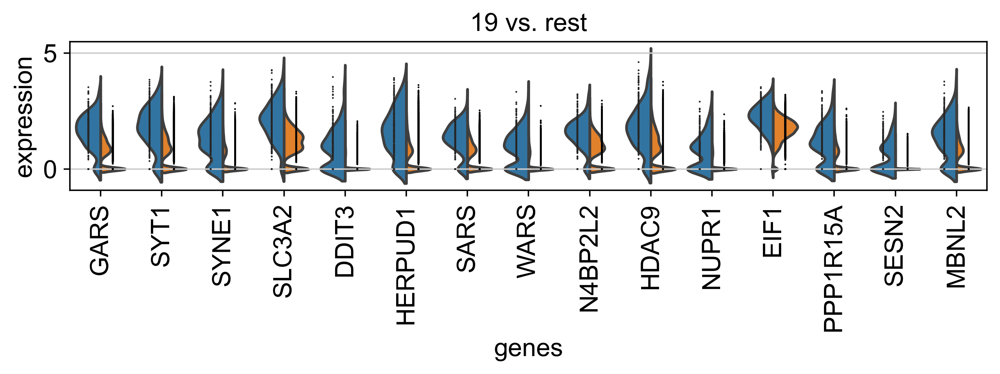

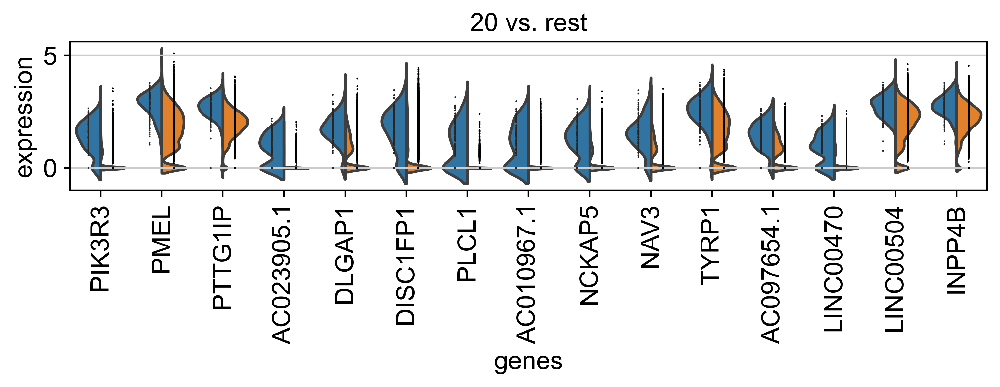

In [73]:
with plt.rc_context({'figure.figsize': (9, 1.5)}):
    sc.pl.rank_genes_groups_violin(GEX_adata_filtered, n_genes=15, jitter=False)

In [74]:
cluster_compare = GEX_adata_filtered.uns['rank_genes_groups']
groups = cluster_compare['names'].dtype.names
df_cluster_compare=pd.DataFrame(
    {group + '_' + key[:1]: cluster_compare[key][group]
    for group in groups for key in ['names', 'pvals']})

In [75]:
df_cluster_compare

,0_n,0_p,1_n,1_p,2_n,2_p,3_n,3_p,4_n,4_p,...,16_n,16_p,17_n,17_p,18_n,18_p,19_n,19_p,20_n,20_p
0,SLC17A6,0.0,ATAD2,0.000000e+00,IMMP2L,0.0,LINC01320,0.000000e+00,DISC1FP1,0.000000e+00,...,NRG3,7.626242e-305,ARL6IP1,8.905138e-212,HMGB1,1.140232e-142,GARS,2.930845e-103,PIK3R3,1.045055e-56
1,LHFPL3-AS1,0.0,DNMT1,0.000000e+00,LYST,0.0,LYST,5.038325e-308,AC013287.1,0.000000e+00,...,FBXL7,2.723634e-245,CCNB1,6.494946e-172,DLEU2,8.802047e-118,SYT1,5.665182e-95,PMEL,2.984939e-44
2,OCA2,0.0,HELLS,0.000000e+00,SYT14,0.0,LGALS3,1.523518e-275,ORC6,0.000000e+00,...,LINC01320,3.961259e-154,DEPDC1,2.103209e-145,DIAPH3,2.502388e-115,SYNE1,8.198850e-91,PTTG1IP,1.719955e-41
3,SMC2,0.0,DLGAP1,0.000000e+00,MAGI2,0.0,ZFPM2-AS1,3.448348e-247,DNER,0.000000e+00,...,ARMC9,9.518263e-144,BIRC5,3.285105e-119,DEK,1.478100e-114,SLC3A2,1.002826e-90,AC023905.1,3.548964e-41
4,PDE10A,0.0,ABCB5,0.000000e+00,SLC17A6,0.0,SGCD,1.952069e-245,GPC6,0.000000e+00,...,LYST,1.584313e-137,PRC1,3.155954e-117,MT-CYB,5.491166e-100,DDIT3,2.277038e-90,DLGAP1,1.450652e-36
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36596,S100B,0.0,SOX6,1.434836e-211,DIAPH3,0.0,HELLS,0.000000e+00,DCLK1,2.167307e-211,...,HELLS,2.618596e-169,ROBO2,1.103137e-136,OCA2,1.099120e-46,ATAD2,3.710581e-114,RAD23A,4.485232e-35
36597,CD74,0.0,IMMP2L,1.325457e-295,TPX2,0.0,ESCO2,0.000000e+00,FMNL2,2.214210e-217,...,DEK,8.297726e-181,PRKG1,4.226548e-147,IGF2BP2,8.487132e-50,PARP1,7.477745e-118,TIMP3,9.193460e-38
36598,NRG3,0.0,TCF12,0.000000e+00,DNMT1,0.0,DIAPH3,0.000000e+00,PTPRJ,6.100361e-232,...,ORC6,1.978018e-184,LINGO2,5.248459e-157,LINC01320,3.096917e-54,SERBP1,5.275501e-121,DCBLD2,4.201154e-40
36599,HLA-DRB1,0.0,PARD3,0.000000e+00,ATAD2,0.0,CLSPN,0.000000e+00,TANC1,2.433720e-268,...,ATAD2,5.897654e-195,LRMDA,3.792128e-165,GULP1,1.269288e-57,NCL,4.939365e-141,ROBO2,2.562589e-43


In [76]:
df_cluster_compare.to_csv(Output_d+'/T0_OAK/Anndata/OAK1to20_leiden_1_DEgenes.csv')

In [77]:
GEX_adata_filtered.write(Output_d+'/T0_OAK/Anndata/OAK1to20_GEXwGuide_clustered.h5ad')